In [ ]:
import zipfile
import os
files = zipfile.ZipFile('datasets.zip','r')
files.extractall(os.getcwd())

In [9]:
import os

# 获取当前工作目录
current_dir = os.getcwd()

# 构建目标目录路径
target_dir = os.path.join(current_dir, "datasets", "images")

# 列出目标目录下的所有文件和文件夹
file_list = os.listdir(target_dir)

# 打印文件列表
for file in file_list:
    print(file)


P1.png
P2.png


In [6]:
from PIL import Image
img1 = Image.open("datasets/images/P1.png")
print("image1 size: ", img1.size)

img2 = Image.open("datasets/images/P2.png")
print("image2 size: ", img2.size)

image1 size:  (7574, 5625)
image2 size:  (7039, 5551)


In [10]:
import os

# 获取当前工作目录
current_dir = os.getcwd()

# 构建目标目录路径
target_dir = os.path.join(current_dir, "datasets", "labels")

# 列出目标目录下的所有文件和文件夹
file_list = os.listdir(target_dir)

# 打印文件列表
for file in file_list:
    print(file)


P1.txt
P2.txt


In [11]:
# 打开文件并读取内容
with open("datasets/labels/P1.txt", "r") as file:
    content = file.read()

# 打印文件内容
print(content)


5625 4995 6101 4995 6101 5393 5625 5393 storage-tank 0
4719 3719 4772 3700 4781 3723 4728 3745 small-vehicle 1
4743 3771 4791 3752 4798 3771 4750 3791 small-vehicle 1
4759 3816 4807 3804 4811 3822 4768 3836 small-vehicle 1
4782 3895 4829 3875 4841 3898 4786 3918 small-vehicle 1
4876 3872 4924 3854 4932 3874 4884 3893 small-vehicle 1
4902 3959 4892 3940 4946 3918 4956 3942 small-vehicle 0
4934 4054 4920 4030 4973 4012 4987 4038 small-vehicle 0
4803 3941 4848 3928 4856 3956 4807 3966 small-vehicle 1
4813 3986 4857 3974 4865 3991 4819 4007 small-vehicle 1
4829 4036 4817 4013 4862 3996 4876 4019 small-vehicle 0
4833 4034 4876 4015 4886 4035 4840 4053 small-vehicle 1
4845 4054 4889 4034 4898 4054 4853 4076 small-vehicle 1
4852 4077 4900 4060 4910 4081 4860 4101 small-vehicle 1
4710 4247 4672 4231 4723 4123 4761 4137 small-vehicle 0
4823 4322 4852 4332 4830 4378 4803 4370 small-vehicle 1
4838 4412 4866 4417 4853 4456 4824 4449 small-vehicle 1
4820 4452 4849 4457 4832 4504 4804 4496 small-veh

In [12]:
import os
import json
def txt2coco(txt_path):
    annotations = []
    with open(txt_path, 'r') as f:
        labels = f.readlines()
    anno_id = 1
    for label in labels:
        x1, y1, x2, y2, x3, y3, x4, y4, class_name, _ = label.strip().split(" ")
        x1 = int(x1)
        x2 = int(x2)
        x3 = int(x3)
        x4 = int(x4)
        y1 = int(y1)
        y2 = int(y2)
        y3 = int(y3)
        y4 = int(y4)
        # 仅保留small-vehicle类
        if class_name == "small-vehicle":
            # 四边形直接计算外接矩形
            xmin = min(x1, x2, x3, x4)
            ymin = min(y1, y2, y3, y4)
            xmax = max(x1, x2, x3, x4)
            ymax = max(y1, y2, y3, y4)
            w = xmax - xmin + 1
            h = ymax- ymin + 1
            annotations.append({"id": anno_id, "bbox": [xmin, ymin, w, h], "image_id": 1, "category_id": 1})
            anno_id += 1
    return annotations

os.makedirs("datasets/annotations", exist_ok=True)
label1_txt_path = "datasets/labels/P1.txt"
anno1 = txt2coco(label1_txt_path)
img1 = Image.open("datasets/images/P1.png")
w, h = img1.size
image1 = [{"id": 1, "filename": "P1.png", "width": w, "height": h}]
categories = [{"id": 1, "name": "small-vehicle"}]
instance1 = {
    "images": image1,
    "annotations": anno1,
    "categories": categories
}

with open("datasets/annotations/P1.json", "w") as f:
    json.dump(instance1, f, indent=1)
    
label2_txt_path = "datasets/labels/P2.txt"
anno2 = txt2coco(label2_txt_path)
img2 = Image.open("datasets/images/P2.png")
w, h = img2.size
image2 = [{"id": 1, "filename": "P2.png", "width": w, "height": h}]
categories = [{"id": 1, "name": "small-vehicle"}]
instance2 = {
    "images": image2,
    "annotations": anno2,
    "categories": categories
}

with open("datasets/annotations/P2.json", "w") as f:
    json.dump(instance2, f, indent=1)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 12.0) 
import json
import numpy as np

bboxeswh = []
for ann in anno1:

    bboxeswh.append([ann["bbox"][2], ann["bbox"][3]])
bboxeswh = np.array(bboxeswh)
plt.scatter(bboxeswh[:, 0], bboxeswh[:, 1])
plt.title("All bboxes sizes")
plt.show()

: 

In [15]:
pip install opencv-python

   ---------------------------------------- 0.0/38.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.6 MB 259.2 kB/s eta 0:02:29
   ---------------------------------------- 0.0/38.6 MB 245.8 kB/s eta 0:02:37
   ---------------------------------------- 0.0/38.6 MB 245.8 kB/s eta 0:02:37
   ---------------------------------------- 0.0/38.6 MB 245.8 kB/s eta 0:02:37
   ---------------------------------------- 0.1/38.6 MB 181.6 kB/s eta 0:03:33
   ---------------------------------------- 0.1/38.6 MB 261.7 kB/s eta 0:02:28
   ---------------------------------------- 0.1/38.6 MB 284.4 kB/s eta 0:02:16
   ---------------------------------------- 0.1/38.6 MB 266.9 kB/s eta 0:02:25
   ---------------------------------------- 0.1/38.6 MB 266.9 kB/s eta 0:02:25
   ---------------------------------------- 0.1/38.6 MB 266.2 kB/s eta 0:02:25


In [22]:
import cv2
import os

# 求两个box之间的overlap面积
def bbox_overlap(bbox1, bbox2):
    xmin1, ymin1, w1, h1 = bbox1
    xmax1 = xmin1 + w1 - 1
    ymax1 = ymin1 + h1 - 1
    xmin2, ymin2, w2, h2 = bbox2
    xmax2 = xmin2 + w2 - 1
    ymax2 = ymin2 + h2 - 1
    l = max(xmin1, xmin2)
    t = max(ymin1, ymin2)
    r = min(xmax1, xmax2)
    b = min(ymax1, ymax2)

    w = max(r - l + 1, 0)
    h = max(b - t + 1, 0)
    overlap = w * h
    return overlap
    
# 用来滑窗裁剪数据的函数
def crop_patch(img_path, bboxes, size, overlap, img_save_path, anno_save_path):
    # 读取目标图片
    img = cv2.imread(img_path)
    assert img is not None
    # 获取图片尺寸
    img_h, img_w, _ = img.shape
    image_id = 1
    ann_id = 1
    images = []
    annotations = []
    categories = [{"id": 1, "name": "small-vehicle"}]
    # 进行滑窗
    # 沿着宽度方向滑动窗口
    for xi in range(img_w // overlap[0]):
        # 沿着高度方向滑动窗口
        for yi in range(img_h // overlap[1]):
            # 从原始的label中生成这个子图的label
            isvaild = False
            for bbox in bboxes:
                #  找到这个子图范围内的label框
                if bbox_overlap(bbox, [xi*overlap[0], yi*overlap[1], size[0], size[1]]):
                    xmin, ymin, w, h = bbox
                    xmax = xmin + w - 1
                    ymax = ymin + h - 1
                    # 将它的坐标减去左上角裁剪坐标，从原始大图的参考系转换到子图的参考系
                    xmin = max(xmin - xi*overlap[0], 0)
                    ymin = max(ymin - yi*overlap[1], 0)
                    xmax = min(xmax - xi*overlap[0], size[0])
                    ymax = min(ymax - yi*overlap[1], size[1])
                    bbox_croped = [xmin, ymin, xmax - xmin + 1, ymax - ymin + 1]
                    annotations.append({
                        "id": ann_id,
                        "bbox": bbox_croped,
                        "area": size[0] * size[1],
                        "segmentation": [[]],
                        "iscrowd": 0,
                        "category_id": 1,
                        "image_id": image_id
                    })
                    ann_id += 1
                    isvaild = True
            if isvaild:
                # 从原图裁剪出当前的子图
                img_patch = img[yi*overlap[1]: min(yi*overlap[1]+size[1], img.shape[0]), xi*overlap[0]: min(xi*overlap[0]+size[0], img.shape[1]), :]
                img_filename = os.path.basename(img_path).split(".")[0] + "_" + str(xi*overlap[0]) + "_" + str(yi*overlap[1]) + ".png"
                images.append({"id": image_id, "file_name": img_filename, "width": size[0], "height": size[1]})
                # 保存这个子图
                cv2.imwrite( os.path.join(img_save_path,img_filename), img_patch)

                image_id += 1
    instance = {
        "images": images,
        "annotations": annotations,
        "categories": categories
    }
    with open(anno_save_path, "w") as f:
        json.dump(instance, f, indent=1)  

In [23]:
train_img_path = "datasets/images/P1.png"
bboxes1 = []
for ann in anno1:
    bboxes1.append(ann["bbox"])
img_save_path="datasets/crop_patchs/"
os.makedirs(img_save_path, exist_ok=True)
anno_save_path="datasets/annotations/train_patches_p1.json"
os.makedirs("datasets/annotations/", exist_ok=True)
crop_patch(train_img_path, bboxes1, size=[512, 512], overlap=[128,128], img_save_path=img_save_path, anno_save_path=anno_save_path)

In [24]:
val_img_path = "datasets/images/P2.png"
bboxes2 = []
for ann in anno2:
    bboxes2.append(ann["bbox"])
img_save_path="datasets/crop_patchs/"
os.makedirs(img_save_path, exist_ok=True)
anno_save_path="datasets/annotations/train_patches_p2.json"
os.makedirs("datasets/annotations/", exist_ok=True)
crop_patch(val_img_path, bboxes2, size=[512, 512], overlap=[128,128], img_save_path=img_save_path, anno_save_path=anno_save_path)

In [25]:
from glob import glob
_, p1_h = Image.open("datasets/images/P1.png").size
_, p2_h = Image.open("datasets/images/P2.png").size
train_imgs = []
val_imgs = []
for img in glob("datasets/crop_patchs/*.png"):
    imgbasename = os.path.basename(img)
    if imgbasename.split('_')[0] == 'P1':
        ymin = int(imgbasename.split('_')[2].split(".")[0])
        # 位于图像上半区的划分为训练集
        if ymin <= p1_h / 2:
            train_imgs.append(imgbasename)
        # 位于下半区的为验证集
        else:
            val_imgs.append(imgbasename)
    if imgbasename.split('_')[0] == 'P2':
        ymin = int(imgbasename.split('_')[2].split(".")[0])
        # 位于图像上半区的划分为训练集
        if ymin <= p2_h / 2:
            train_imgs.append(imgbasename)
        # 位于下半区的为验证集
        else:
            val_imgs.append(imgbasename) 

imgname2anno = dict()
with open("datasets/annotations/train_patches_p1.json", "r") as f:
    p1_labels = json.load(f)
p1_imgid2name = dict()
p1_images = p1_labels["images"]
for img in p1_images:
    p1_imgid2name[img['id']] = img['file_name']
for anno in p1_labels["annotations"]:
    img_id = anno["image_id"]
    imgname = p1_imgid2name[img_id]
    if imgname not in imgname2anno:
        imgname2anno[imgname] = []
    imgname2anno[imgname].append(anno)
    
with open("datasets/annotations/train_patches_p2.json", "r") as f:
    p2_labels = json.load(f)
p2_imgid2name = dict()
p2_images = p2_labels["images"]
for img in p2_images:
    p2_imgid2name[img['id']] = img['file_name']
for anno in p2_labels["annotations"]:
    img_id = anno["image_id"]
    imgname = p2_imgid2name[img_id]
    if imgname not in imgname2anno:
        imgname2anno[imgname] = []
    imgname2anno[imgname].append(anno)

train_images = []
train_annotations = []
val_images = []
val_annotations = []
train_imgid = 1
train_anno_id = 1
val_imgid = 1
val_anno_id = 1
for imgname, annos in imgname2anno.items():
    if imgname in train_imgs:
        w, h = Image.open(os.path.join("datasets/crop_patchs/", imgname)).size
        train_images.append({"id": train_imgid, "file_name": imgname, "height":h, "width": w})
        for anno in annos:
            anno["id"] = train_anno_id
            anno["image_id"] = train_imgid
            train_annotations.append(anno)
            train_anno_id += 1
        train_imgid += 1
    if imgname in val_imgs:
        w, h = Image.open(os.path.join("datasets/crop_patchs/", imgname)).size
        val_images.append({"id": val_imgid, "file_name": imgname, "height":h, "width": w})
        for anno in annos:
            anno["id"] = val_anno_id
            anno["image_id"] = val_imgid
            val_annotations.append(anno)
            val_anno_id += 1
        val_imgid += 1

instane_train = {"images": train_images,
                "annotations": train_annotations,
                "categories": p1_labels["categories"]}
    
instane_val = {"images": val_images,
                "annotations": val_annotations,
                "categories": p1_labels["categories"]}

with open("datasets/annotations/train_patches.json", "w") as f:
    json.dump(instane_train, f, indent=1)
with open("datasets/annotations/val_patches.json", "w") as f:
    json.dump(instane_val, f, indent=1)

In [26]:
import json
with open("datasets/annotations/train_patches.json", "r") as f:
    labels = json.load(f)
imagename2id = {}
imageid2anno = {}
imagename2imageinfo = {}
for image in labels["images"]:
    imagename2id[image["file_name"]] = image["id"]
    imagename2imageinfo[image["file_name"]] = image
for anno in labels["annotations"]:
    if anno["image_id"] not in imageid2anno:
        imageid2anno[anno["image_id"]] = []
    imageid2anno[anno["image_id"]].append(anno)

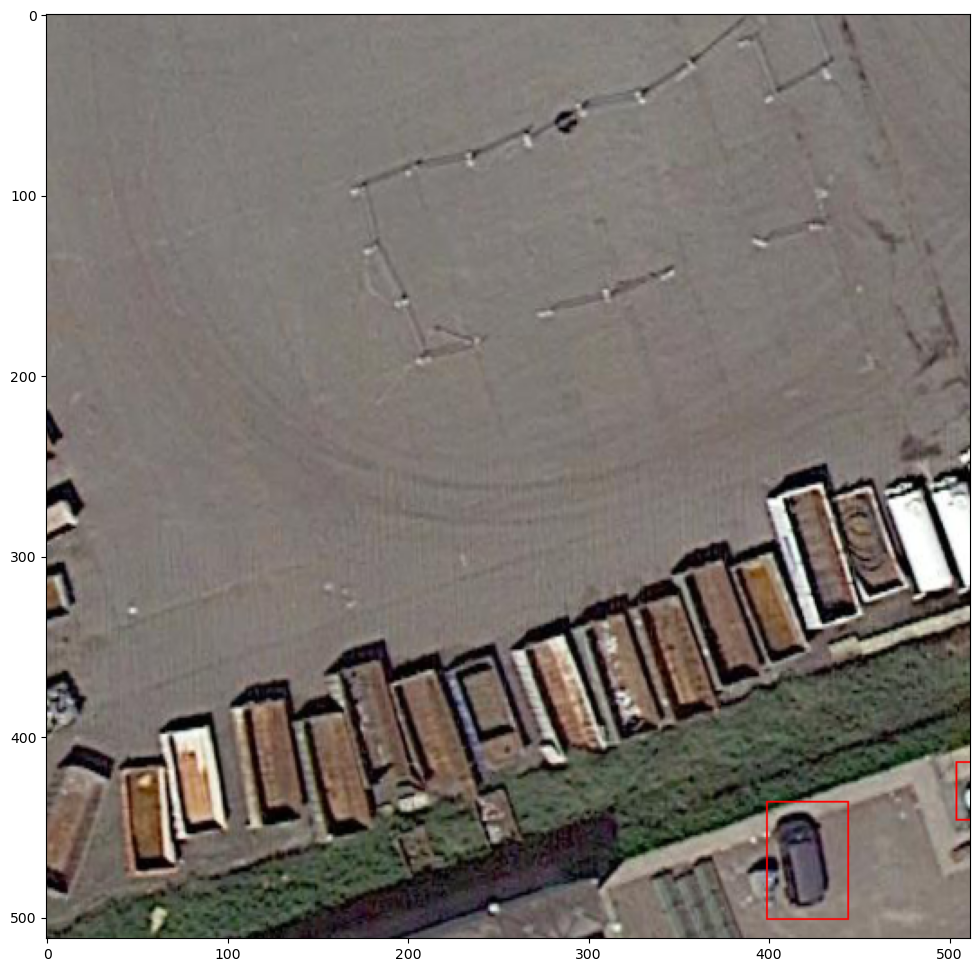

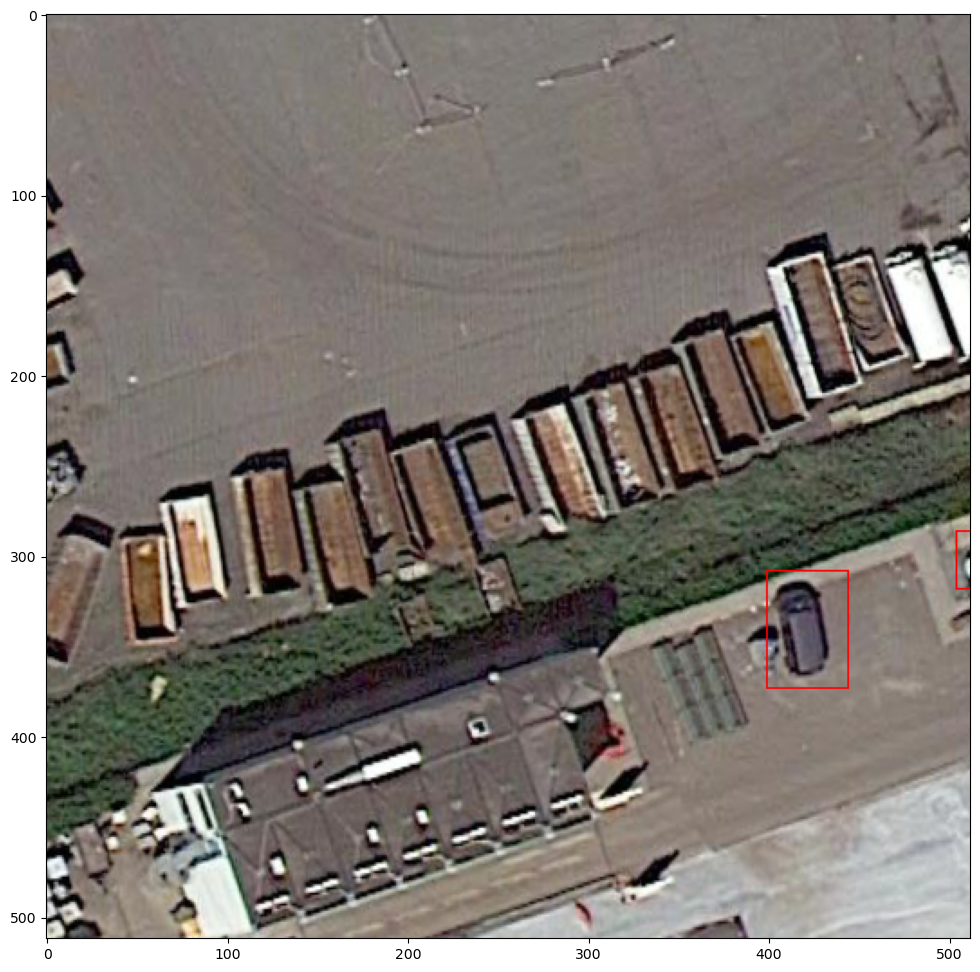

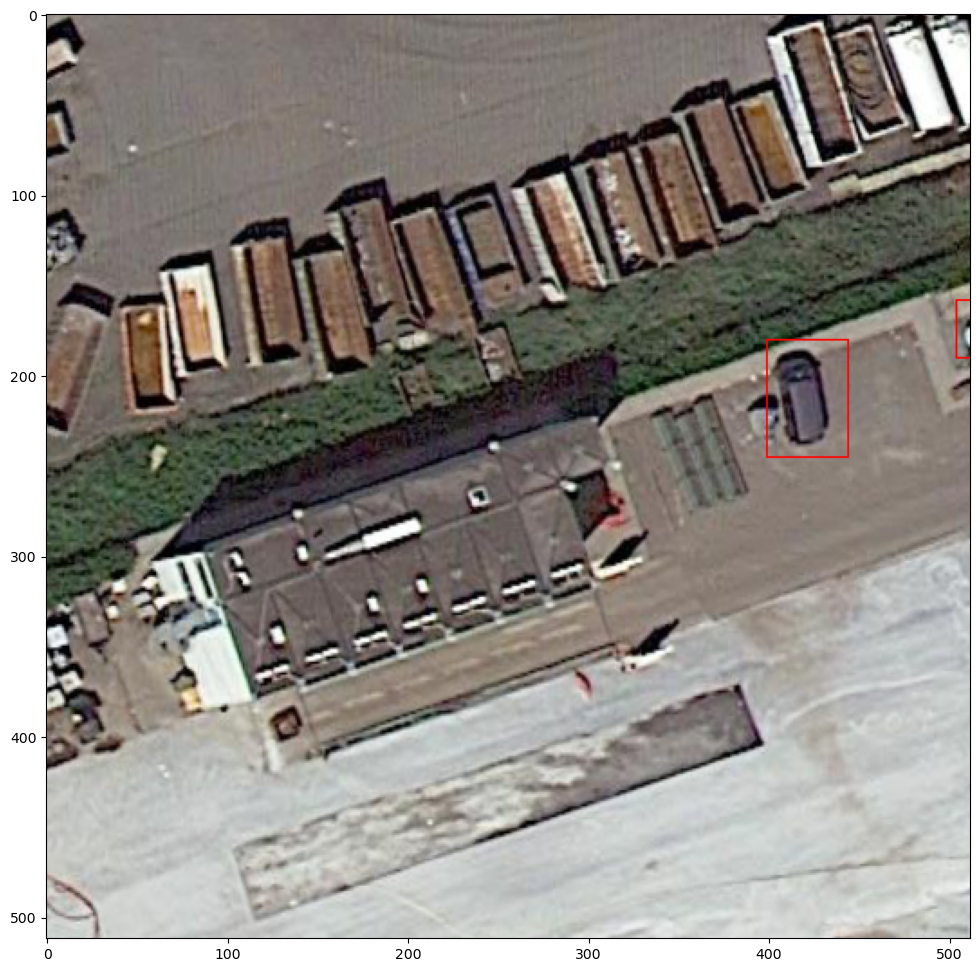

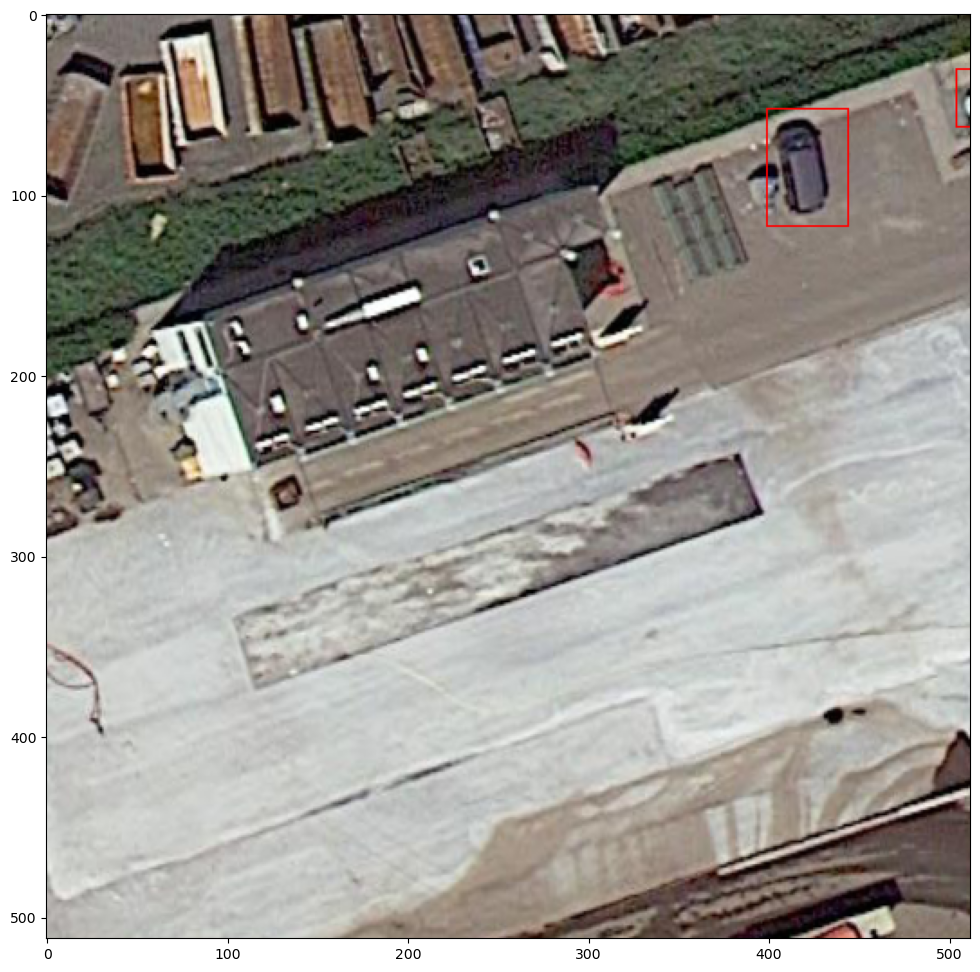

In [21]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 12.0) 
import cv2
import numpy as np
from glob import glob
k=1
for imgname, imgid in imagename2id.items():

    img = cv2.imread(os.path.join("datasets/crop_patchs/", imgname))
    annos = imageid2anno[imgid]
    bboxes = []
    for anno in annos:
        bboxes.append(anno["bbox"])
    for det in bboxes:
        bbox = np.array(det[:4]).astype(int)
        cv2.rectangle(img, (bbox[0],bbox[1]), (bbox[0]+bbox[2], bbox[1]+bbox[3]), (0,0,255), 1)

    im2 = img[:,:,::-1] 
    plt.imshow(im2)
    plt.show()
    k+=1
    if k ==5:
        break

In [29]:
import subprocess

# 安装依赖项
subprocess.call(["pip", "install", "-r", "src/requirements.txt"])

# 安装seaborn
subprocess.call(["pip", "install", "seaborn"])


0

In [30]:
import subprocess

# 安装依赖项
subprocess.call(["pip", "install", "git+https://github.com/open-mmlab/cocoapi.git#subdirectory=pycocotools"])


1

In [33]:
import os

# 切换到src目录
os.chdir("datasets/src")

# 执行setup.py脚本
os.system("python setup.py develop")

# 切换回上一级目录
os.chdir("..")


In [34]:
import requests

url = "https://open-mmlab.s3.ap-northeast-2.amazonaws.com/mmdetection/v2.0/cascade_rcnn/cascade_rcnn_r50_fpn_20e_coco/cascade_rcnn_r50_fpn_20e_coco_bbox_mAP-0.41_20200504_175131-e9872a90.pth"
response = requests.get(url)

with open("model.pth", "wb") as f:
    f.write(response.content)


In [35]:
_base_ = './cascade_rcnn_r50_fpn_1x_coco.py'

In [36]:
model=dict(pretrained=None, # backbone不加载预训练，后面加载COCO的预训练
     roi_head=dict(bbox_head=[ # cascade rcnn 的三个bbox head
      dict( # 第一个bbox head
          type='Shared2FCBBoxHead',  # 采用两个全连接层的结构
          in_channels=256, # 输入通道为256
          fc_out_channels=1024, # 输出通道为1024
          roi_feat_size=7, # 特征图大小为7
          num_classes=1, # 类别数量1
          bbox_coder=dict(  # 坐标编码形式
              type='DeltaXYWHBBoxCoder', # delta 和 xywh格式转换编码
              target_means=[0., 0., 0., 0.],
              target_stds=[0.1, 0.1, 0.2, 0.2]),
          reg_class_agnostic=True, # 回归分支忽略类别，之区分前景和背景
          loss_cls=dict( # loss函数
              type='CrossEntropyLoss', # 分类loss采用cross entropy
              use_sigmoid=False,  # 不使用sigmoid
              loss_weight=1.0), # loss权重
          loss_bbox=dict(type='SmoothL1Loss', beta=1.0, # 回归loss采用smoothl1 loss
                         loss_weight=1.0)), # loss 权重
          dict( # 第二个bbox head， 结构和第一个一致
          type='Shared2FCBBoxHead',
          in_channels=256,
          fc_out_channels=1024,
          roi_feat_size=7,
          num_classes=1,
          bbox_coder=dict(
              type='DeltaXYWHBBoxCoder',
              target_means=[0., 0., 0., 0.],
              target_stds=[0.05, 0.05, 0.1, 0.1]),
          reg_class_agnostic=True,
          loss_cls=dict(
              type='CrossEntropyLoss',
              use_sigmoid=False,
              loss_weight=1.0),
          loss_bbox=dict(type='SmoothL1Loss', beta=1.0,
                         loss_weight=1.0)),
          dict( # 第二个bbox head， 结构和第一第二个一致
          type='Shared2FCBBoxHead',
          in_channels=256,
          fc_out_channels=1024,
          roi_feat_size=7,
          num_classes=1,
          bbox_coder=dict(
              type='DeltaXYWHBBoxCoder',
              target_means=[0., 0., 0., 0.],
              target_stds=[0.033, 0.033, 0.067, 0.067]),
          reg_class_agnostic=True,
          loss_cls=dict(
              type='CrossEntropyLoss',
              use_sigmoid=False,
              loss_weight=1.0),
          loss_bbox=dict(type='SmoothL1Loss', beta=1.0, loss_weight=1.0))
  ]))

In [37]:
data_root = 'datasets/'

In [38]:
classes = ('small-vehicle', )

In [39]:
data = dict(
samples_per_gpu=1, # 每个gpu上的图片数量
train=dict(classes=classes, ann_file=data_root + 'annotations/train_patches.json', img_prefix=data_root + 'crop_patchs/',), # 训练集数据路径
val=dict(classes=classes, ann_file=data_root + 'annotations/val_patches.json', img_prefix=data_root + 'crop_patchs/',), # 验证集数据路径
test=dict(classes=classes, ann_file=data_root + 'annotations/val_patches.json', img_prefix=data_root + 'crop_patchs/')) # 测试集数据路径

In [40]:
optimizer = dict(type='SGD', lr=0.00125, momentum=0.9, weight_decay=0.0001)

In [41]:
lr_config = dict(
  policy='step',
  warmup='linear',
  warmup_iters=10,
  warmup_ratio=0.001,
  step=[1,1]) #采用线性warn-up

In [42]:
total_epochs = 1

In [43]:
log_config = dict(
interval=5,
hooks=[
  dict(type='TextLoggerHook'),
  # dict(type='TensorboardLoggerHook')
])

In [44]:
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = 'cascade_rcnn_r50_fpn_20e_coco_bbox_mAP-0.41_20200504_175131-e9872a90.pth' # load COCO预训练模型
resume_from = None
workflow = [('train', 1)]

In [45]:
with open("src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle.py", "r") as f:
    content = f.read()
    print(content)


_base_ = './cascade_rcnn_r50_fpn_1x_coco.py'
model=dict(pretrained=None,
           roi_head=dict(bbox_head=[
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
                bbox_coder=dict(
                    type='DeltaXYWHBBoxCoder',
                    target_means=[0., 0., 0., 0.],
                    target_stds=[0.1, 0.1, 0.2, 0.2]),
                reg_class_agnostic=True,
                loss_cls=dict(
                    type='CrossEntropyLoss',
                    use_sigmoid=False,
                    loss_weight=1.0),
                loss_bbox=dict(type='SmoothL1Loss', beta=1.0,
                               loss_weight=1.0)),
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
        

In [46]:
import os

os.system("python src/tools/train.py src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle.py --seed 666")


1

In [47]:
import os

files = os.listdir("models/cascade_rcnn_r50_fpn-small-vehicle/")
for file in files:
    print(file)


In [48]:
dict(
    type='Resize',
    img_scale=[(2000, 440), (2000, 728)],
    multiscale_mode='range',
    keep_ratio=True),

({'type': 'Resize',
  'img_scale': [(2000, 440), (2000, 728)],
  'multiscale_mode': 'range',
  'keep_ratio': True},)

In [49]:
with open("src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain.py", "r") as f:
    content = f.read()
    print(content)


_base_ = './cascade_rcnn_r50_fpn_1x_coco.py'
model=dict(pretrained=None,
           roi_head=dict(bbox_head=[
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
                bbox_coder=dict(
                    type='DeltaXYWHBBoxCoder',
                    target_means=[0., 0., 0., 0.],
                    target_stds=[0.1, 0.1, 0.2, 0.2]),
                reg_class_agnostic=True,
                loss_cls=dict(
                    type='CrossEntropyLoss',
                    use_sigmoid=False,
                    loss_weight=1.0),
                loss_bbox=dict(type='SmoothL1Loss', beta=1.0,
                               loss_weight=1.0)),
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
        

In [50]:
import os

os.system("python src/tools/train.py src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain.py --seed 666")


1

In [51]:
rpn=dict(
    assigner=dict(
        type='MaxIoUAssigner',
        pos_iou_thr=0.6, # 从0.7修改为0.6
        neg_iou_thr=0.2, # 从0.3修改为0.2
        min_pos_iou=0.2, # 从0.3修改为0.2， 如果通过pos_iou_thr的限制有gt没有匹配到anchor，则大于min_pos_iou的anchor也可以用来匹配
        match_low_quality=True, 
        ignore_iof_thr=-1),
    sampler=dict(
        type='RandomSampler', # 对anchor的采样使用随机采样
        num=256, # 每次采样256个
        pos_fraction=0.5, # 正样本比例为0.5
        neg_pos_ub=-1, # 负样本数量相对正样本比例的限制，-1代表不限制
        add_gt_as_proposals=False), # 是否将gt的框作为anchor加入
    allowed_border=0, # 是否允许anchor超出图像边界
    pos_weight=-1, # 正样本求loss时候得权重，默认值-1为不加权
    debug=False),

In [54]:
rcnn=[
    dict(
        assigner=dict(
            type='MaxIoUAssigner',
            pos_iou_thr=0.4, # 从0.5修改为0.4
            neg_iou_thr=0.4, # 从0.5修改为0.4
            min_pos_iou=0.4, # 从0.5修改为0.4
            match_low_quality=False,
            ignore_iof_thr=-1),
        sampler=dict(
            type='RandomSampler',
            num=512,
            pos_fraction=0.25,
            neg_pos_ub=-1,
            add_gt_as_proposals=True),
        pos_weight=-1,
        debug=False),
    dict(
        assigner=dict(
            type='MaxIoUAssigner',
            pos_iou_thr=0.5, # 从0.6修改为0.5
            neg_iou_thr=0.5, # 从0.6修改为0.5
            min_pos_iou=0.5, # 从0.6修改为0.5
            match_low_quality=False,
            ignore_iof_thr=-1),
        sampler=dict(
            type='RandomSampler',
            num=512,
            pos_fraction=0.25,
            neg_pos_ub=-1,
            add_gt_as_proposals=True),
        pos_weight=-1,
        debug=False),
    dict(
        assigner=dict(
            type='MaxIoUAssigner',
            pos_iou_thr=0.6, # 从0.7修改为0.6
            neg_iou_thr=0.6, # 从0.7修改为0.6
            min_pos_iou=0.6, # 从0.7修改为0.6
            match_low_quality=False,
            ignore_iof_thr=-1),
        sampler=dict(
            type='RandomSampler',
            num=512,
            pos_fraction=0.25,
            neg_pos_ub=-1,
            add_gt_as_proposals=True),
        pos_weight=-1,
        debug=False)
    ]

In [55]:
with open("src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456.py", "r") as f:
    content = f.read()
    print(content)


_base_ = './cascade_rcnn_r50_fpn_1x_coco.py'
model=dict(pretrained=None,
           roi_head=dict(bbox_head=[
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
                bbox_coder=dict(
                    type='DeltaXYWHBBoxCoder',
                    target_means=[0., 0., 0., 0.],
                    target_stds=[0.1, 0.1, 0.2, 0.2]),
                reg_class_agnostic=True,
                loss_cls=dict(
                    type='CrossEntropyLoss',
                    use_sigmoid=False,
                    loss_weight=1.0),
                loss_bbox=dict(type='SmoothL1Loss', beta=1.0,
                               loss_weight=1.0)),
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
        

In [3]:
import os

os.system("python src/tools/train.py src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456.py --seed 666")


2

In [4]:
def hflip(image, bboxes):
    # 左右翻转
    h_flip_img = cv2.flip(image, 1)
    hflipped = bboxes.copy()
    w = h_flip_img.shape[1]
    hflipped[..., 0::4] = w - bboxes[..., 2::4] - 1
    hflipped[..., 2::4] = w - bboxes[..., 0::4] - 1
    hflipped[..., 0::4] = np.clip(hflipped[..., 0::4], 0, w - 1)
    hflipped[..., 2::4] = np.clip(hflipped[..., 2::4], 0, w - 1)
    return h_flip_img, hflipped

def vflip(image, bboxes):
    # 上下翻转
    v_flip_img = cv2.flip(image, 0)
    h = v_flip_img.shape[0]
    vflipped = bboxes.copy()
    vflipped[..., 1::4] = h - bboxes[..., 3::4] - 1
    vflipped[..., 3::4] = h - bboxes[..., 1::4] - 1
    vflipped[..., 1::4] = np.clip(vflipped[..., 1::4], 0, h - 1)
    vflipped[..., 3::4] = np.clip(vflipped[..., 3::4], 0, h - 1)
    return v_flip_img, vflipped

def rot90(image, bboxes):
    # 90度旋转
    h = image.shape[0]
    img90=np.rot90(image, -1)
    rotated = bboxes.copy()
    rotated[:, [0, 1, 2, 3]] = bboxes[:, [1, 0, 3, 2]]
    rotated[:, [0, 2]] = h - rotated[:, [0, 2]]
    return img90, rotated

In [5]:
import json
import os
import cv2
import numpy as np
with open("datasets/annotations/train_patches.json", "r") as f:
    train_labels = json.load(f)
images = train_labels["images"]

imageid2name = dict()
imageid2bbox = dict()
for img in images:
    imageid2name[img["id"]] = img["file_name"]
for anno in train_labels["annotations"]:
    image_id = anno["image_id"]
    if image_id not in imageid2bbox:
        imageid2bbox[image_id] = []
    xmin, ymin, w, h = anno["bbox"]
    xmax = xmin + w - 1
    ymax = ymin + h - 1
    imageid2bbox[image_id].append([xmin, ymin, xmax, ymax])
    
image_id = 1
anno_id = 1
aug_images = []
aug_annotations = []
os.makedirs("datasets/train_aug_patchs", exist_ok=True)
for imgid, bboxes in imageid2bbox.items():
    imagename = imageid2name[imgid]
    img = cv2.imread(os.path.join("datasets/crop_patchs/", imagename))
    bboxes = np.array(bboxes)
    hflip_img, hflip_bboxes = hflip(img, bboxes)
    hflip_img_name = imagename.split(".")[0] + "_hflip.png"
    cv2.imwrite(os.path.join("datasets/train_aug_patchs", hflip_img_name), hflip_img)
    aug_images.append({"id": image_id, "file_name": hflip_img_name, "height": hflip_img.shape[0], "width": hflip_img.shape[1]})
    for bbox in hflip_bboxes:
        xmin, ymin, xmax, ymax = bbox
        w = xmax - xmin + 1
        h = ymax - ymin + 1
        aug_annotations.append({"id": anno_id, 
                                "image_id": image_id, 
                                "bbox": [int(xmin), int(ymin), int(w), int(h)], 
                                "segmentation": [[]], 
                                "area": int(w*h),
                                "iscrowd": 0,
                                "category_id": 1})
        anno_id += 1
    image_id += 1
    img = cv2.imread(os.path.join("datasets/crop_patchs/", imagename))
    vflip_img, vflip_bboxes = vflip(img, bboxes)
    vflip_img_name = imagename.split(".")[0] + "_vflip.png"
    cv2.imwrite(os.path.join("datasets/train_aug_patchs", vflip_img_name), vflip_img)
    aug_images.append({"id": image_id, "file_name": vflip_img_name, "height": vflip_img.shape[0], "width": vflip_img.shape[1]})
    for bbox in vflip_bboxes:
        xmin, ymin, xmax, ymax = bbox
        w = xmax - xmin + 1
        h = ymax - ymin + 1
        aug_annotations.append({"id": anno_id, 
                                "image_id": image_id, 
                                "bbox": [int(xmin), int(ymin), int(w), int(h)], 
                                "segmentation": [[]], 
                                "area": int(w*h),
                                "iscrowd": 0,
                                "category_id": 1})
        anno_id += 1                      
    image_id += 1
    img = cv2.imread(os.path.join("datasets/crop_patchs/", imagename))
    rot90_img, rot90_bboxes = rot90(img, bboxes)
    rot90_img_name = imagename.split(".")[0] + "_rot90.png"
    cv2.imwrite(os.path.join("datasets/train_aug_patchs", rot90_img_name), rot90_img)
    aug_images.append({"id": image_id, "file_name": rot90_img_name, "height": rot90_img.shape[0], "width": rot90_img.shape[1]})
    for bbox in rot90_bboxes:
        xmin, ymin, xmax, ymax = bbox
        w = xmax - xmin + 1
        h = ymax - ymin + 1
        aug_annotations.append({"id": anno_id, 
                                "image_id": image_id, 
                                "bbox": [int(xmin), int(ymin), int(w), int(h)], 
                                "segmentation": [[]], 
                                "area": int(w*h),
                                "iscrowd": 0,
                                "category_id": 1})
        anno_id += 1                      
    image_id += 1
    aug_instance = {
    "images": aug_images,
    "annotations": aug_annotations,
    "categories": train_labels["categories"]
}
with open("datasets/annotations/train_aug_patches.json", "w") as f:
    json.dump(aug_instance, f, indent=1)

In [6]:
import json
with open("datasets/annotations/train_aug_patches.json", "r") as f:
    labels = json.load(f)
imagename2id = {}
imageid2anno = {}
imagename2imageinfo = {}
for image in labels["images"]:
    imagename2id[image["file_name"]] = image["id"]
    imagename2imageinfo[image["file_name"]] = image
for anno in labels["annotations"]:
    if anno["image_id"] not in imageid2anno:
        imageid2anno[anno["image_id"]] = []
    imageid2anno[anno["image_id"]].append(anno)

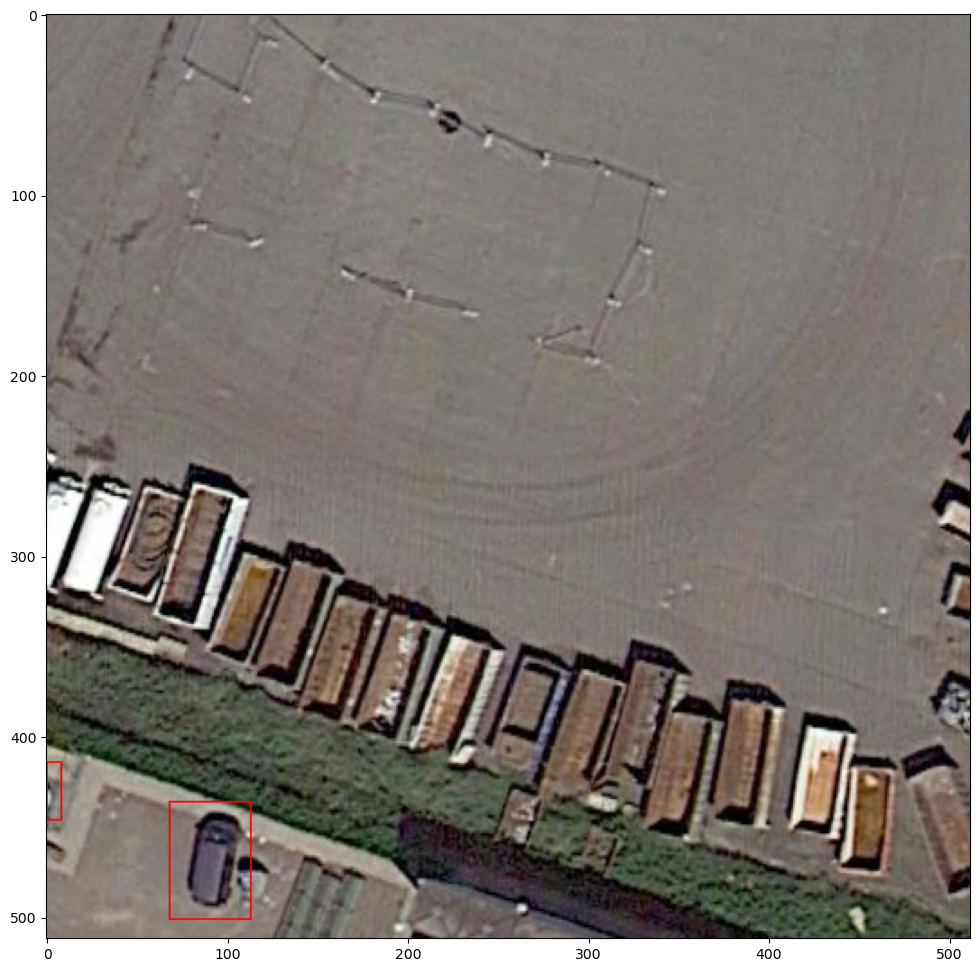

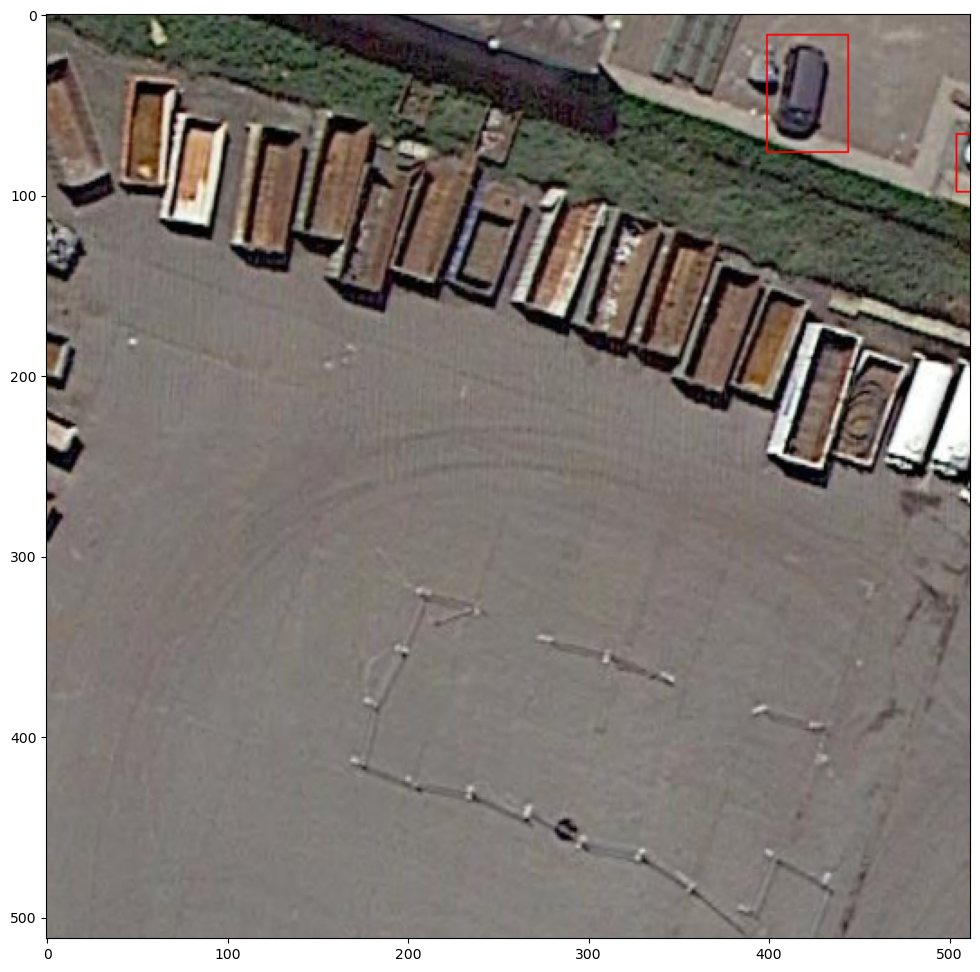

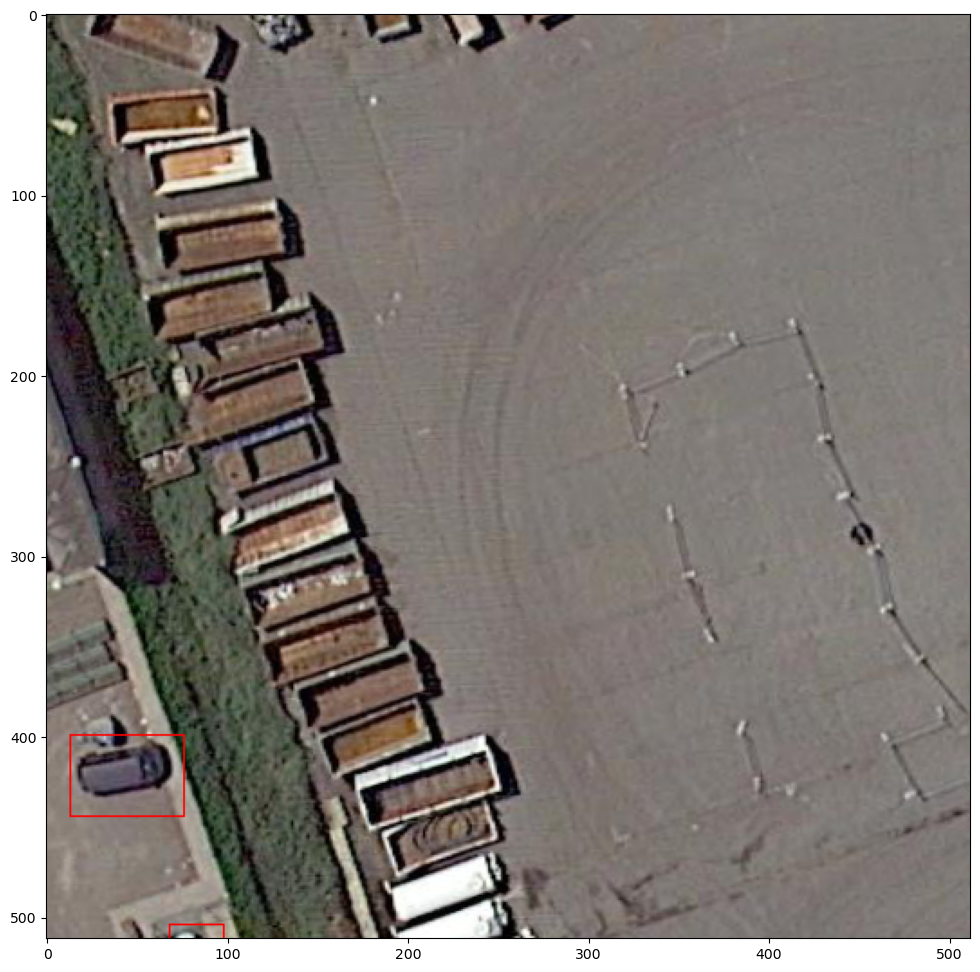

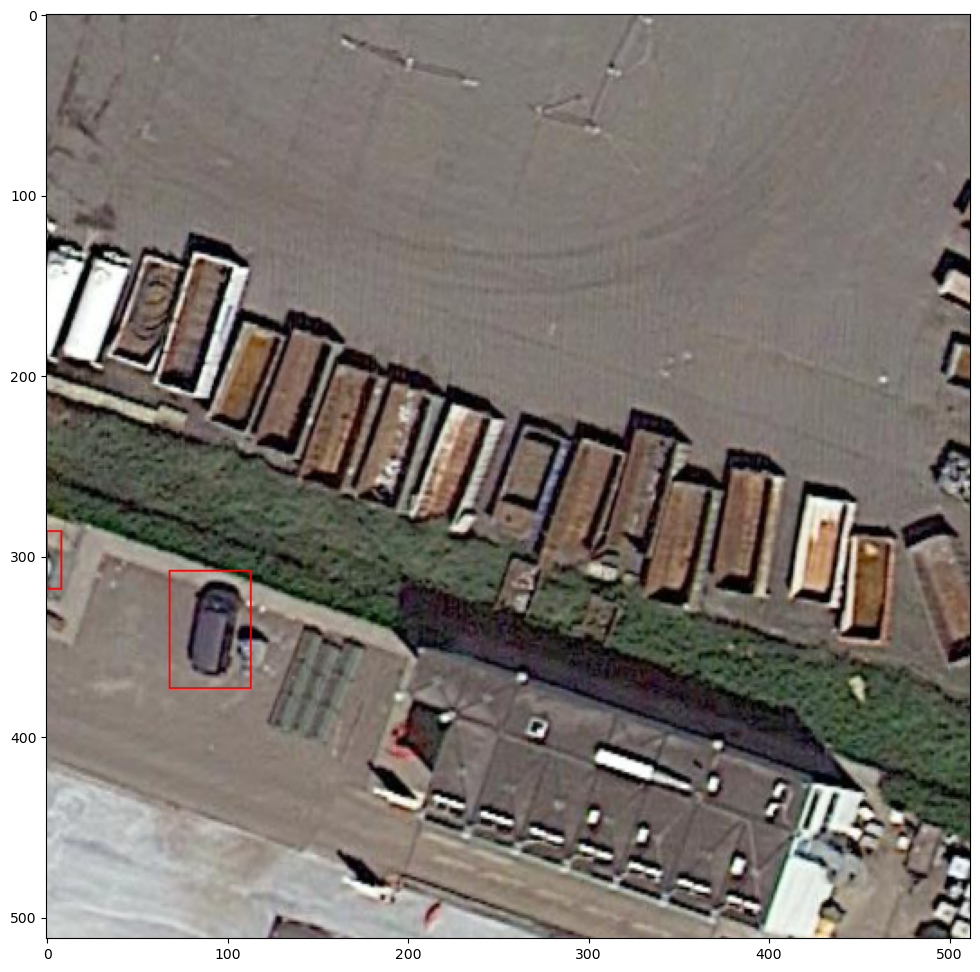

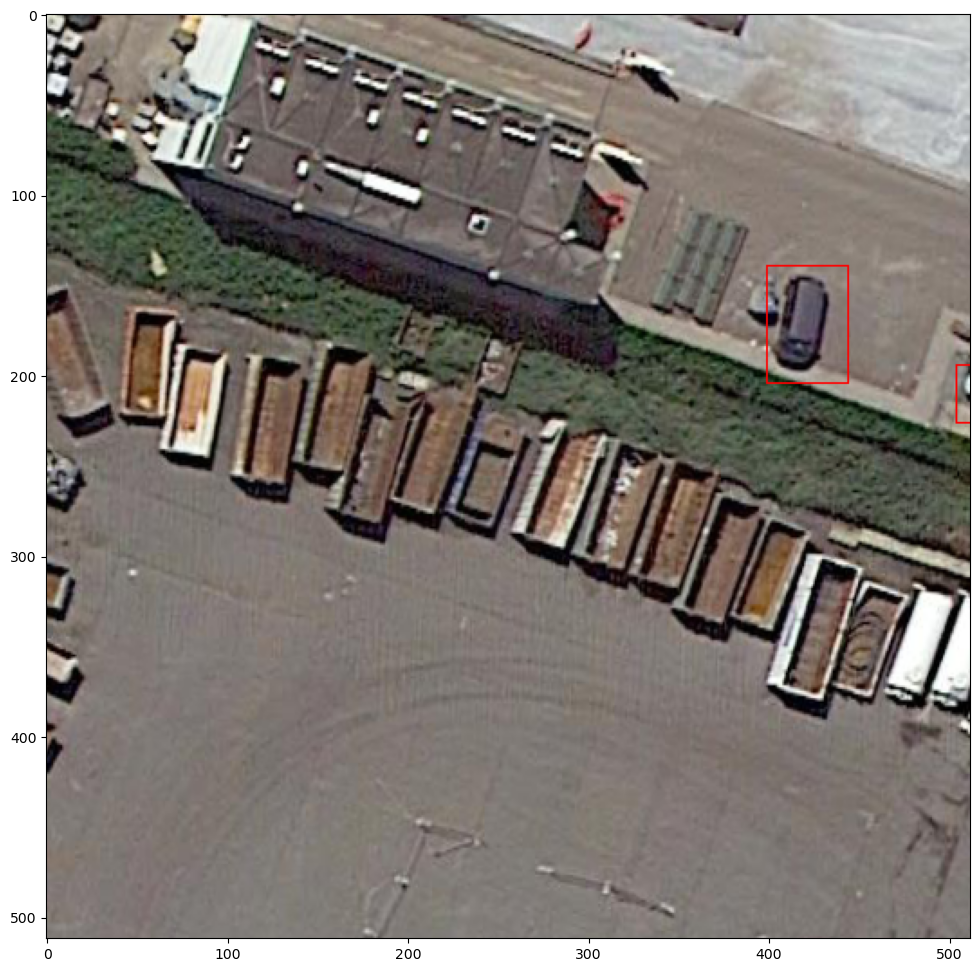

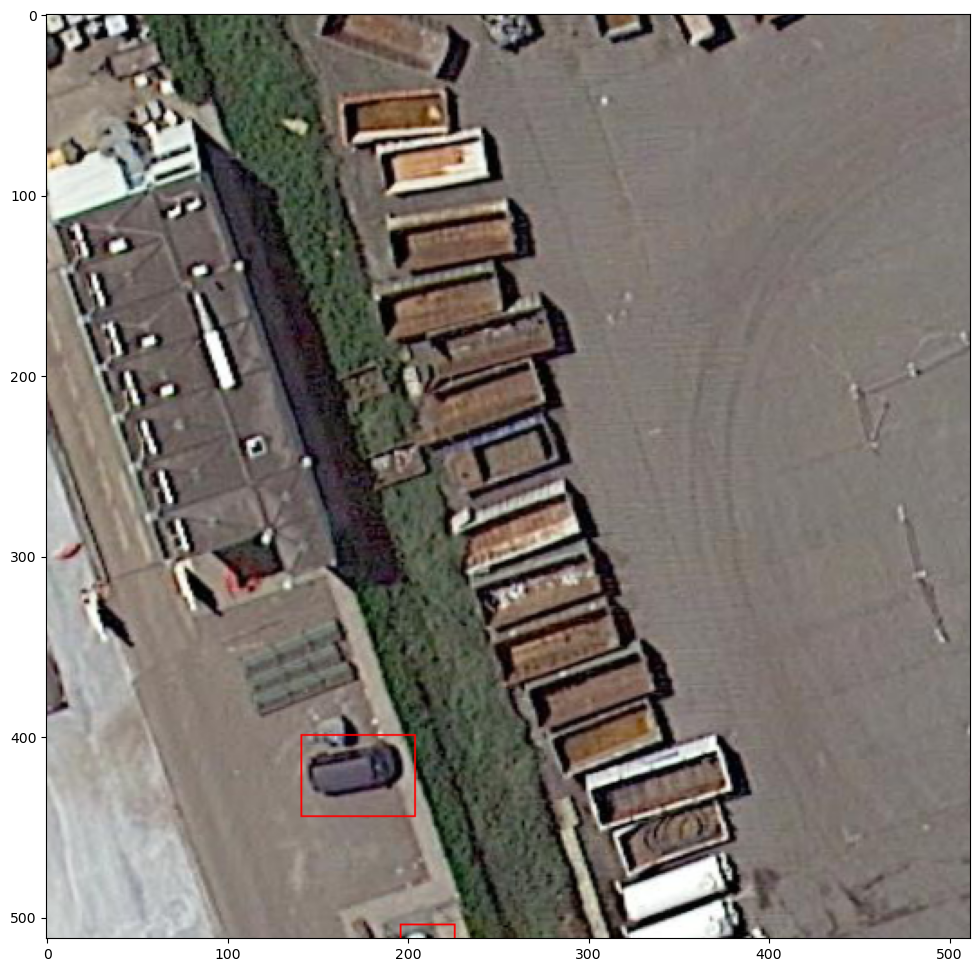

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 12.0) 
import cv2
import numpy as np
from glob import glob
k = 0
for imgname, imgid in imagename2id.items():
    img = cv2.imread(os.path.join("datasets/train_aug_patchs/", imgname))
    annos = imageid2anno[imgid]
    bboxes = []
    for anno in annos:
        bboxes.append(anno["bbox"])
    for det in bboxes:
        bbox = np.array(det[:4]).astype(int)
        cv2.rectangle(img, (bbox[0],bbox[1]), (bbox[0]+bbox[2], bbox[1]+bbox[3]), (0,0,255), 1)

    im2 = img[:,:,::-1] 
    plt.imshow(im2)
    plt.show()
    k += 1
    if k==6:
        break

In [3]:
import os

file_path = 'datasets/src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle-mstrain-train_aug.py'

if os.path.exists(file_path):
    with open(file_path, 'r') as file:
        content = file.read()
        print(content)
else:
    print("File not found.")


_base_ = './cascade_rcnn_r50_fpn_1x_coco.py'
model=dict(pretrained=None,
           roi_head=dict(bbox_head=[
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
                bbox_coder=dict(
                    type='DeltaXYWHBBoxCoder',
                    target_means=[0., 0., 0., 0.],
                    target_stds=[0.1, 0.1, 0.2, 0.2]),
                reg_class_agnostic=True,
                loss_cls=dict(
                    type='CrossEntropyLoss',
                    use_sigmoid=False,
                    loss_weight=1.0),
                loss_bbox=dict(type='SmoothL1Loss', beta=1.0,
                               loss_weight=1.0)),
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
        

In [9]:
import os

file_path = 'src/tools/train.py'
config_path = 'src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle-mstrain-train_aug.py'
seed = 666

if os.path.exists(file_path) and os.path.exists(config_path):
    os.system(f"python {file_path} {config_path} --seed {seed}")
else:
    print("File not found.")


File not found.


In [5]:
import os

file_path = 'datasets/src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456-test_tta.py'

if os.path.exists(file_path):
    with open(file_path, 'r') as file:
        content = file.read()
        print(content)
else:
    print("File not found.")

_base_ = './cascade_rcnn_r50_fpn_1x_coco.py'
model=dict(pretrained=None,
           roi_head=dict(bbox_head=[
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
                bbox_coder=dict(
                    type='DeltaXYWHBBoxCoder',
                    target_means=[0., 0., 0., 0.],
                    target_stds=[0.1, 0.1, 0.2, 0.2]),
                reg_class_agnostic=True,
                loss_cls=dict(
                    type='CrossEntropyLoss',
                    use_sigmoid=False,
                    loss_weight=1.0),
                loss_bbox=dict(type='SmoothL1Loss', beta=1.0,
                               loss_weight=1.0)),
            dict(
                type='Shared2FCBBoxHead',
                in_channels=256,
                fc_out_channels=1024,
                roi_feat_size=7,
                num_classes=1,
        

In [7]:
import os

file_path = 'datasets/src/tools/test.py'
config_path = 'datasets/src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456-test_tta.py'
model_path = 'datasets/models/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456/epoch_1.pth'
eval_type = 'bbox'

if os.path.exists(file_path) and os.path.exists(config_path) and os.path.exists(model_path):
    os.system(f"python {file_path} {config_path} {model_path} --eval {eval_type}")
else:
    print("File not found.")


File not found.


In [8]:
import os

# 读取文件内容
with open("datasets/src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456-test_tta.py", "r") as f:
    content = f.read()

# 执行文件内容中的代码
exec(content)


In [9]:
import os

# 执行命令行命令
os.system("python src/tools/test.py src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456-test_tta.py models/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456/epoch_1.pth --eval bbox")


2

In [11]:
import os

# 读取文件内容
with open("datasets/src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456-test_tta-softnms.py", "r") as f:
    content = f.read()

# 执行文件内容中的代码
exec(content)


In [12]:
import os

# 执行命令行命令
os.system("python src/tools/test.py src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456-test_tta-softnms.py models/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456/epoch_1.pth --eval bbox")


2

In [13]:
import os

os.system("python src/tools/test.py src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456-test_tta.py models/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456/epoch_1.pth --show")


2

In [14]:
import os

os.system("python src/tools/test.py src/configs/cascade_rcnn/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456-test_tta.py models/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456/epoch_1.pth --format-only --options jsonfile_prefix=./results/cas_r50_val")


2

In [11]:
import json
import numpy as np
with open("datasets/annotations/train_patches.json", "r") as f:
    val_raw_labels = json.load(f)
imageid2name = dict()
for img in val_raw_labels["images"]:
    imageid2name[img['id']] = img['file_name']
with open("datasets/annotations/P1.json", "r") as f:
    val_predict_labels = json.load(f)

p1_bboxes = []
p2_bboxes = []
for anno in val_predict_labels:
    imgname = imageid2name[anno['image_id']]
    # 从图片名中获取该patch在原始大图中的位置
    crop_x, crop_y = imgname.split('_')[1], imgname.split('_')[2].split('.')[0]
    crop_x = int(crop_x)
    crop_y = int(crop_y)
    xmin, ymin, w, h = anno['bbox']
    # 将坐标转换回原始大图
    xmin += crop_x
    ymin += crop_y
    bbox_new = [xmin, ymin, w, h, anno['score']]
    if 'P1' in imgname.split('_')[0]:   
        p1_bboxes.append(bbox_new)
    if 'P2' in imgname.split('_')[0]:
        p2_bboxes.append(bbox_new)
p1_bboxes = np.array(p1_bboxes)
p2_bboxes = np.array(p2_bboxes)

TypeError: string indices must be integers

In [2]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 12.0) 
# 由于验证集数据是从图像下半区裁剪，我们可视化拼接后下半区的部分结果：
p1_img = cv2.imread("datasets/images/P1.png")
p1_img_val = p1_img[p1_img.shape[0]//2:, :, :]
for box in p1_bboxes:
    x, y, w, h, score = box
    if score>0.7:
        y-=p1_img.shape[0]//2
        cv2.rectangle(p1_img_val, (int(x), int(y)), (int(x + w), int(y + h)), (0, 255, 255), 2)
p1_img_val = p1_img_val[1000:2500,4000:5500,:]
p1_img_val = p1_img_val[::-1, :, :]
plt.imshow(p1_img_val)
plt.show()

NameError: name 'p1_bboxes' is not defined

In [5]:
pip install mmdet


   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
    --------------------------------------- 0.0/2.2 MB 495.5 kB/s eta 0:00:05
    --------------------------------------- 0.0/2.2 MB 495.5 kB/s eta 0:00:05
    --------------------------------------- 0.0/2.2 MB 495.5 kB/s eta 0:00:05
    --------------------------------------- 0.0/2.2 MB 495.5 kB/s eta 0:00:05
   - -------------------------------------- 0.1/2.2 MB 262.6 kB/s eta 0:00:09
   -- ------------------------------------- 0.1/2.2 MB 379.3 kB/s eta 0:00:06
   -- ------------------------------------- 0.2/2.2 MB 418.0 kB/s eta 0:00:05
   --- ------------------------------------ 0.2/2.2 MB 484.9 kB/s eta 0:00:05
   --- ------------------------------------ 0.2/2.2 MB 484.9 kB/s eta 0:00:05
   --- ------------------------------------ 0.2/2.2 MB 402.0 kB/s eta 0:00:06
   ---- ----------------------------------- 0.3/2.2 MB 482.1 kB/s eta 0:00:05
   -

In [6]:
from mmdet.ops import nms
# nms
p1_bboxes = np.array(p1_bboxes)
p1_bboxes[:, 2] += p1_bboxes[:, 0]
p1_bboxes[:, 3] += p1_bboxes[:, 1]
p1_bboxes_nmsed = nms(p1_bboxes, 0.3)[0].tolist()

p2_bboxes = np.array(p2_bboxes)
p2_bboxes[:, 2] += p2_bboxes[:, 0]
p2_bboxes[:, 3] += p2_bboxes[:, 1]
p2_bboxes_nmsed = nms(p2_bboxes, 0.3)[0].tolist()

# 保存最终结果
with open("results/final_results_p1.json", "w") as f:
    json.dump(p1_bboxes_nmsed, f)
with open("results/final_results_p2.json", "w") as f:
    json.dump(p2_bboxes_nmsed, f)

# 可视化nms后的结果
p1_img = cv2.imread("datasets/images/P1.png")
p1_img_val = p1_img[p1_img.shape[0]//2:, :, :]
for box in p1_bboxes_nmsed:
    x1, y1, x2, y2, score = box
    if score>0.7:
        y1-=p1_img.shape[0]//2
        y2-=p1_img.shape[0]//2
        cv2.rectangle(p1_img_val, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 255), 2)
p1_img_val = p1_img_val[1000:2500,4000:5500,:]
p1_img_val = p1_img_val[::-1, :, :]
plt.imshow(p1_img_val)
plt.show()

ModuleNotFoundError: No module named 'mmcv'

In [4]:
import os

os.system("python src/tools/publish_model.py models/cascade_rcnn_r50_fpn-small-vehicle_mstrain_head456/epoch_1.pth models/final.pth")


2